# Bearing dataset fault predictions

In [117]:
import pandas as pd
import numpy as np
import seaborn as sns

import matplotlib.pyplot as plt
%matplotlib inline

import os

## Collecting Test 2 data points

In [41]:
B1 = pd.DataFrame(columns = ['min','max','range','mean','RMS','standard deviation','skewness','kurtosis','crest factor','form factor'])
B2 = pd.DataFrame(columns = ['min','max','range','mean','RMS','standard deviation','skewness','kurtosis','crest factor','form factor'])
B3 = pd.DataFrame(columns = ['min','max','range','mean','RMS','standard deviation','skewness','kurtosis','crest factor','form factor'])
B4 = pd.DataFrame(columns = ['min','max','range','mean','RMS','standard deviation','skewness','kurtosis','crest factor','form factor'])

test_no = 'Test2'

for i in os.listdir(test_no):
    filename = i
    path = os.path.join(test_no,i)
    df = pd.read_csv(path, sep='\t', names=['B1','B2','B3','B4'])

    for bn in df.columns:
        temp = np.zeros(10)
        temp[0] = df[bn].min()
        temp[1] = df[bn].max()
        temp[2] = df[bn].max() - df[bn].min()
        temp[3] = df[bn].mean()
        temp[4] = np.sqrt((df[bn]**2).mean())
        temp[5] = df[bn].std()
        temp[6] = df[bn].skew()
        temp[7] = df[bn].kurtosis() 
        temp[8] = df[bn].max()/df[bn].mean()
        temp[9] = (df[bn]**2).mean()**(0.5)/df[bn].mean()

        temp_df = pd.DataFrame(temp).transpose()
        temp_df.columns = ['min','max','range','mean','RMS','standard deviation','skewness','kurtosis','crest factor','form factor']
        temp_df['Timestamp'] = filename

        if bn == 'B1': 
            B1 = B1.append(temp_df)
            B1.index = pd.to_datetime(B1['Timestamp'], format= '%Y.%m.%d.%H.%M.%S')

        if bn == 'B2': 
            B2 = B2.append(temp_df)
            B2.index = pd.to_datetime(B2['Timestamp'], format= '%Y.%m.%d.%H.%M.%S')

        if bn == 'B3': 
            B3 = B3.append(temp_df)
            B3.index = pd.to_datetime(B3['Timestamp'], format= '%Y.%m.%d.%H.%M.%S')

        if bn == 'B4': 
            B4 = B4.append(temp_df)
            B4.index = pd.to_datetime(B4['Timestamp'], format= '%Y.%m.%d.%H.%M.%S')


C:\Users\h260482\AppData\Local\Temp\ipykernel_8972\3549172469.py:31: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  B1 = B1.append(temp_df)
C:\Users\h260482\AppData\Local\Temp\ipykernel_8972\3549172469.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  B2 = B2.append(temp_df)
C:\Users\h260482\AppData\Local\Temp\ipykernel_8972\3549172469.py:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  B3 = B3.append(temp_df)
C:\Users\h260482\AppData\Local\Temp\ipykernel_8972\3549172469.py:43: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  B4 = B4.append(temp_df)
C:\Users\h260482\AppData\Local\Temp\ipykernel_8972\3549172469.py:31: FutureWarning: The 

Now the timestamp column is not required as it is mapped as the index of the dataframes. they are dropped for further analysis.

In [43]:
B1.drop('Timestamp',inplace=True,axis=1)
B2.drop('Timestamp',inplace=True,axis=1)
B3.drop('Timestamp',inplace=True,axis=1)
B4.drop('Timestamp',inplace=True,axis=1)

Identifying the onset of the faults form the obtained data

<AxesSubplot:xlabel='Timestamp'>

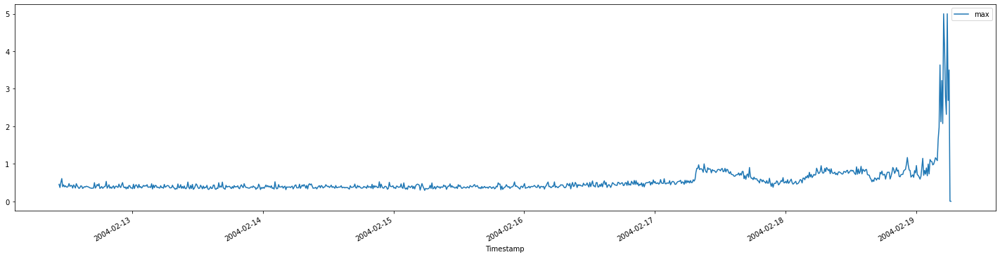

In [44]:
B1['max'].plot(figsize=(25,6),legend=True)

Its observed that after '2004-02-17' there is observable change in the 'bearing 1' sensor output indicating the onset of the faults. Up until this point, it is known that the bearings are running smoothly and then bearing 1 shows fault. This information is transferred and syncronized with the sensor readings.

onset of fault
at time index '2004-02-17 07:32:39', the B1 shows abnormality

from the IMS bearings readme we know that B1 has developed 'outer race failure'.


<AxesSubplot:xlabel='Timestamp'>

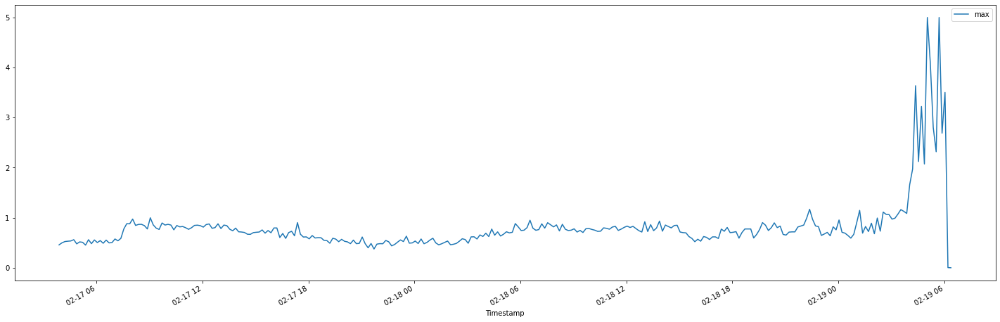

In [45]:
B1['max'].iloc[680:].plot(figsize=(25,8),legend=True)

In [63]:
B1[['max','min']].iloc[700:705]

,max,min
Timestamp,,
2004-02-17 07:12:39,0.54,-0.552
2004-02-17 07:22:39,0.588,-0.581
2004-02-17 07:32:39,0.776,-0.808
2004-02-17 07:42:39,0.881,-0.869
2004-02-17 07:52:39,0.879,-0.903


In [47]:
B1['fault'] = ''
B1.head()

,min,max,range,mean,RMS,standard deviation,skewness,kurtosis,crest factor,form factor,fault
Timestamp,,,,,,,,,,,
2004-02-12 10:32:39,-0.386,0.454,0.84,-0.010196,0.074179,0.073477,0.084,0.629209,-44.527283,-7.275307,
2004-02-12 10:42:39,-0.388,0.369,0.757,-0.002585,0.075382,0.07534,0.052146,0.648742,-142.746076,-29.161382,
2004-02-12 10:52:39,-0.4,0.503,0.903,-0.002484,0.07623,0.076191,0.03281,0.513894,-202.497248,-30.688508,
2004-02-12 11:02:39,-0.576,0.608,1.184,-0.002277,0.078724,0.078693,0.041489,1.158529,-267.063592,-34.579322,
2004-02-12 11:12:39,-0.391,0.391,0.782,-0.002404,0.078474,0.078439,0.028226,0.603617,-162.655238,-32.645152,


In [50]:
B1.head()

,min,max,range,mean,RMS,standard deviation,skewness,kurtosis,crest factor,form factor,fault
Timestamp,,,,,,,,,,,
2004-02-12 10:32:39,-0.386,0.454,0.84,-0.010196,0.074179,0.073477,0.084,0.629209,-44.527283,-7.275307,
2004-02-12 10:42:39,-0.388,0.369,0.757,-0.002585,0.075382,0.07534,0.052146,0.648742,-142.746076,-29.161382,
2004-02-12 10:52:39,-0.4,0.503,0.903,-0.002484,0.07623,0.076191,0.03281,0.513894,-202.497248,-30.688508,
2004-02-12 11:02:39,-0.576,0.608,1.184,-0.002277,0.078724,0.078693,0.041489,1.158529,-267.063592,-34.579322,
2004-02-12 11:12:39,-0.391,0.391,0.782,-0.002404,0.078474,0.078439,0.028226,0.603617,-162.655238,-32.645152,


In [59]:
threshold = pd.to_datetime('2004-02-17 07:32:39')
for i in B1.index:
    if i >= threshold:
        B1.loc[i,'fault'] = 'outer race failure'
    else:
        B1.loc[i,'fault'] = 'normal'

B1.tail()

,min,max,range,mean,RMS,standard deviation,skewness,kurtosis,crest factor,form factor,fault
Timestamp,,,,,,,,,,,
2004-02-19 05:42:39,-5.0,4.998,9.998,-0.002752,0.725001,0.725014,-0.510594,12.581069,-1816.003548,-263.426419,outer race failure
2004-02-19 05:52:39,-2.881,2.688,5.569,-0.004487,0.462012,0.462001,-0.325392,3.761183,-599.127596,-102.977656,outer race failure
2004-02-19 06:02:39,-3.696,3.501,7.197,-0.001703,0.483835,0.483844,-0.377123,4.893243,-2055.691964,-284.094983,outer race failure
2004-02-19 06:12:39,0.0,0.005,0.005,0.001857,0.002103,0.000987,0.579741,3.638694,2.692753,1.132578,outer race failure
2004-02-19 06:22:39,-0.005,0.002,0.007,-0.001162,0.001533,0.001,0.317055,-1.609874,-1.721225,-1.319089,outer race failure


Now all the datapoints are merged into single dataframe 'Test2' and since only bearing 1 failed at the end of test2, faults column corresponding to other bearings are all treated as normal

In [72]:
Test2 = pd.concat([B1,B2,B3,B4])
Test2 = Test2.fillna('normal')

In [80]:
Test2.isnull().sum() # testing to see if there are any null values in the the entire dataframe

min                   0
max                   0
range                 0
mean                  0
RMS                   0
standard deviation    0
skewness              0
kurtosis              0
crest factor          0
form factor           0
fault                 0
dtype: int64

In [116]:
Test2['fault'].value_counts()

normal                3654
outer race failure     282
Name: fault, dtype: int64

<AxesSubplot:xlabel='fault', ylabel='count'>

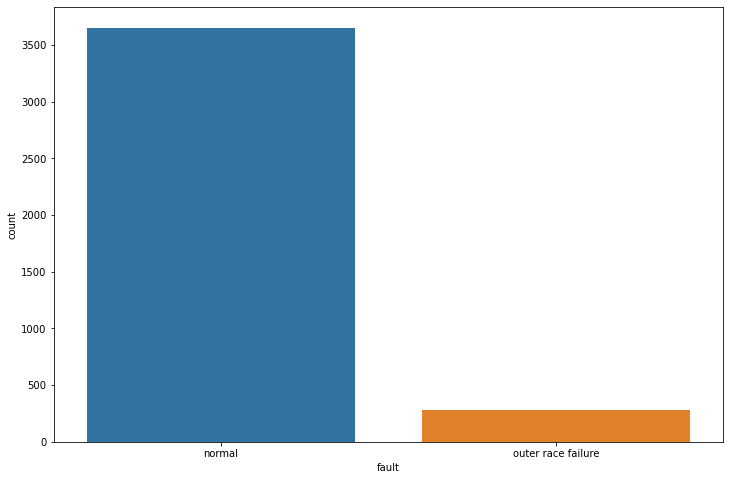

In [125]:
fig = plt.figure(figsize=(12,8))
sns.countplot(x='fault',data=Test2)

In [127]:
Test2.to_csv('Test2.csv')

 ## Test 1 data processing

In [128]:
B1 = pd.DataFrame(columns = ['min','max','range','mean','RMS','standard deviation','skewness','kurtosis','crest factor','form factor'])
B2 = pd.DataFrame(columns = ['min','max','range','mean','RMS','standard deviation','skewness','kurtosis','crest factor','form factor'])
B3 = pd.DataFrame(columns = ['min','max','range','mean','RMS','standard deviation','skewness','kurtosis','crest factor','form factor'])
B4 = pd.DataFrame(columns = ['min','max','range','mean','RMS','standard deviation','skewness','kurtosis','crest factor','form factor'])

test_no = 'Test1'

for i in os.listdir(test_no):
    filename = i
    path = os.path.join(test_no,i)
    df = pd.read_csv(path, sep='\t', names=['B1x','B1y','B2x','B2y','B3x','B3y','B4x','B4y'])

    for bn in df.columns:
        temp = np.zeros(10)
        temp[0] = df[bn].min()
        temp[1] = df[bn].max()
        temp[2] = df[bn].max() - df[bn].min()
        temp[3] = df[bn].mean()
        temp[4] = np.sqrt((df[bn]**2).mean())
        temp[5] = df[bn].std()
        temp[6] = df[bn].skew()
        temp[7] = df[bn].kurtosis() 
        temp[8] = df[bn].max()/df[bn].mean()
        temp[9] = (df[bn]**2).mean()**(0.5)/df[bn].mean()

        temp_df = pd.DataFrame(temp).transpose()
        temp_df.columns = ['min','max','range','mean','RMS','standard deviation','skewness','kurtosis','crest factor','form factor']
        temp_df['Timestamp'] = filename

        if ((bn == 'B1x') | (bn == 'B1y')): 
            B1 = B1.append(temp_df)
            B1.index = pd.to_datetime(B1['Timestamp'], format= '%Y.%m.%d.%H.%M.%S')

        if ((bn == 'B2x') | (bn == 'B2y')): 
            B2 = B2.append(temp_df)
            B2.index = pd.to_datetime(B2['Timestamp'], format= '%Y.%m.%d.%H.%M.%S')

        if ((bn == 'B3x') | (bn == 'B3y')) : 
            B3 = B3.append(temp_df)
            B3.index = pd.to_datetime(B3['Timestamp'], format= '%Y.%m.%d.%H.%M.%S')

        if ((bn == 'B4x') | (bn == 'B4y')): 
            B4 = B4.append(temp_df)
            B4.index = pd.to_datetime(B4['Timestamp'], format= '%Y.%m.%d.%H.%M.%S')


C:\Users\h260482\AppData\Local\Temp\ipykernel_8972\3442125810.py:31: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  B1 = B1.append(temp_df)
C:\Users\h260482\AppData\Local\Temp\ipykernel_8972\3442125810.py:31: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  B1 = B1.append(temp_df)
C:\Users\h260482\AppData\Local\Temp\ipykernel_8972\3442125810.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  B2 = B2.append(temp_df)
C:\Users\h260482\AppData\Local\Temp\ipykernel_8972\3442125810.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  B2 = B2.append(temp_df)
C:\Users\h260482\AppData\Local\Temp\ipykernel_8972\3442125810.py:39: FutureWarning: The 

In [129]:
B1.shape

(4312, 11)

The length of the Dataframe complies with the expectations i.e., twice the length of the datapoints available

2156 (number of datapoints in expt 1) X 2 (number of sensors on each bearing) = 4312

In [131]:
B1.drop('Timestamp',inplace=True,axis=1)
B2.drop('Timestamp',inplace=True,axis=1)
B3.drop('Timestamp',inplace=True,axis=1)
B4.drop('Timestamp',inplace=True,axis=1)

In [132]:
B1.head()

,min,max,range,mean,RMS,standard deviation,skewness,kurtosis,crest factor,form factor
Timestamp,,,,,,,,,,
2003-10-22 12:06:24,-0.72,0.388,1.108,-0.094593,0.124614,0.081124,-0.029995,1.069717,-4.101789,-1.31737
2003-10-22 12:06:24,-0.564,0.701,1.265,-0.09388,0.117493,0.07065,0.220132,3.066925,-7.466969,-1.251523
2003-10-22 12:09:13,-0.654,0.388,1.042,-0.094903,0.123811,0.079517,-0.07008,1.162128,-4.088401,-1.304613
2003-10-22 12:09:13,-0.491,0.581,1.072,-0.093891,0.116833,0.069531,0.126508,2.001798,-6.188019,-1.24434
2003-10-22 12:14:13,-0.623,0.317,0.94,-0.096187,0.125246,0.080219,-0.041649,0.986819,-3.29567,-1.302116


## from the experiment results
At the end of the test-to-failure experiment, 

inner race defect occurred in bearing 3 and 

roller element defect in bearing 4.

# Test1- Bearing 3 fault mapping

<AxesSubplot:xlabel='Timestamp'>

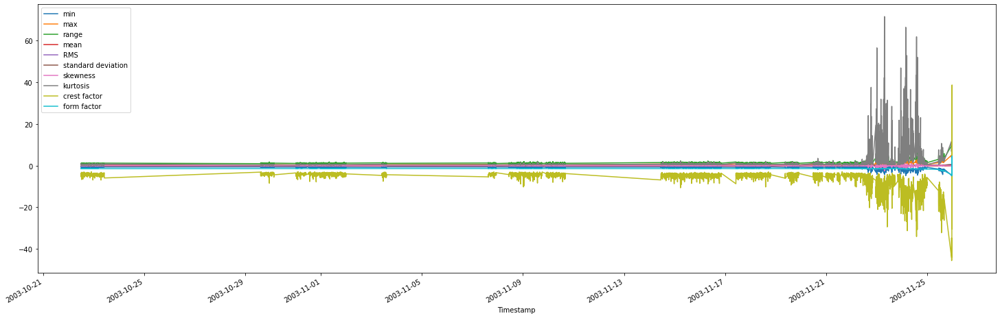

In [134]:
B3.plot(figsize = (25,8))

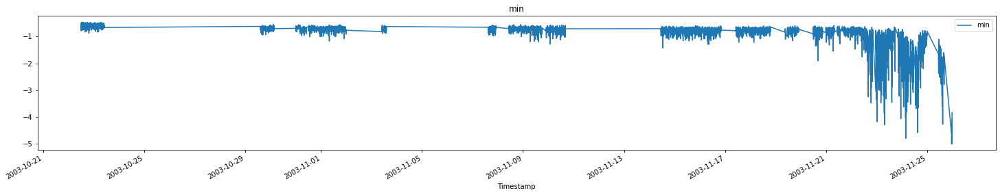

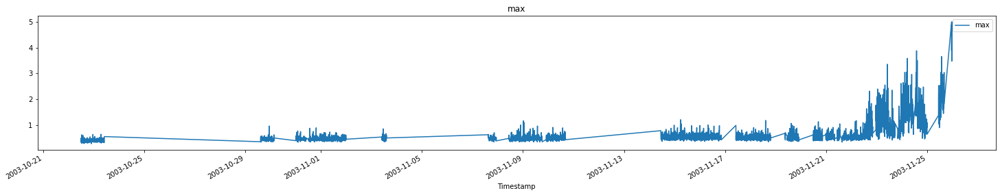

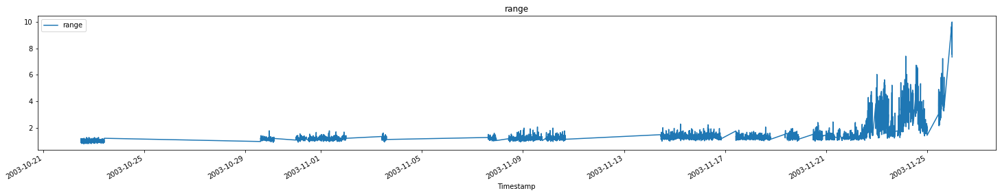

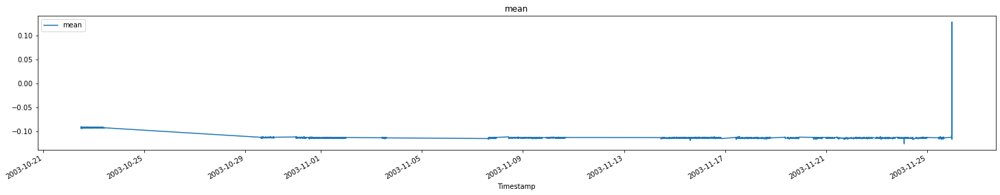

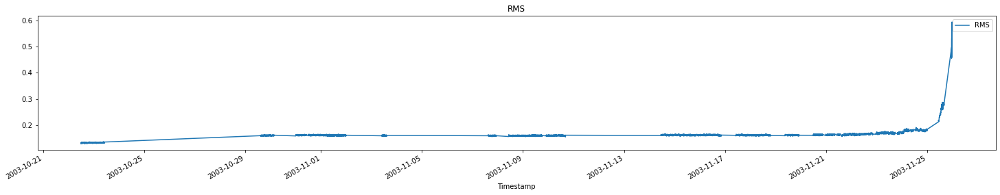

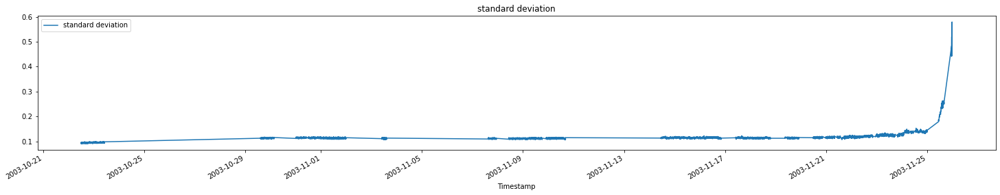

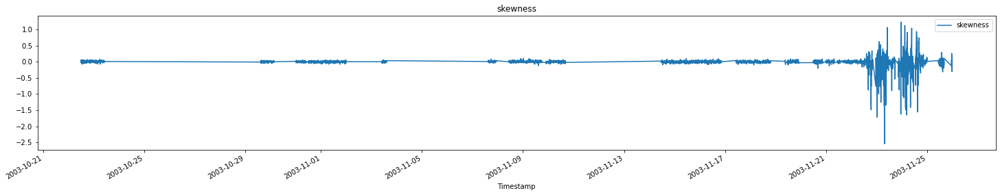

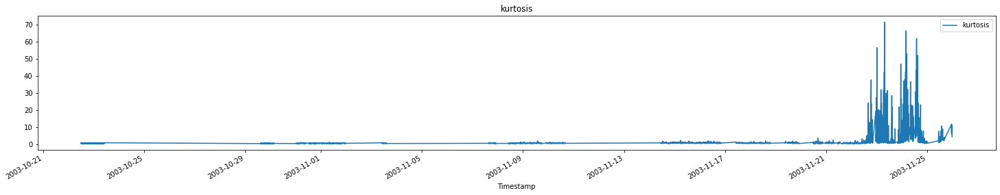

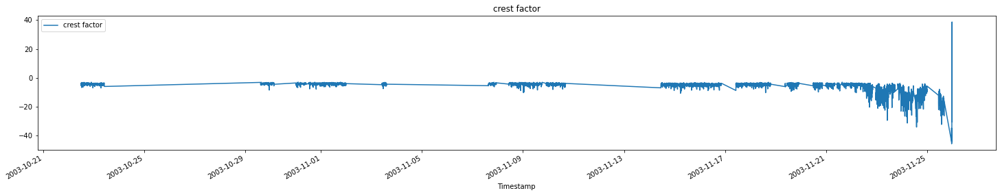

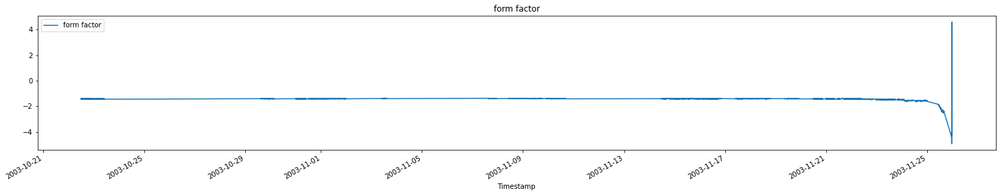

In [202]:
for i in B3.columns:
    plt.figure()
    B3[i].plot(figsize = (25,4), legend=True).set_title(i)

Its observed from the above plots that kurtosis parameter is easier to understad and differenciate the onset of failure

<AxesSubplot:xlabel='Timestamp'>

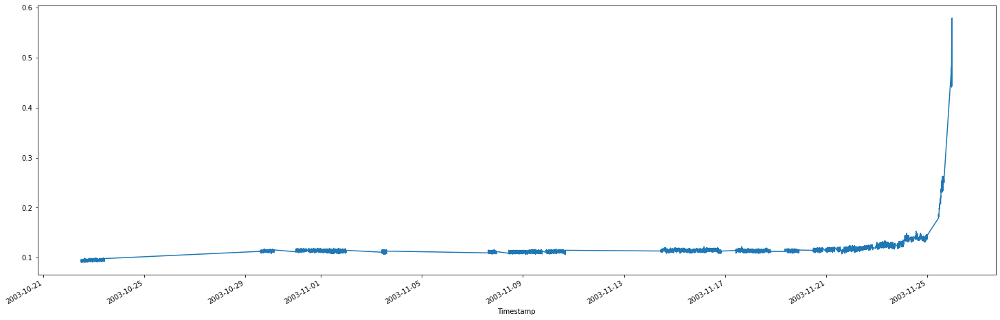

In [176]:
B3['standard deviation'].plot(figsize=(25,8)) 
# visualizing the last 1000 readings to identify the onset of failure

In [191]:
B3.iloc[-700:-650]

,min,max,range,mean,RMS,standard deviation,skewness,kurtosis,crest factor,form factor
Timestamp,,,,,,,,,,
2003-11-22 12:06:56,-0.916,0.747,1.663,-0.113688,0.163155,0.117027,0.046503,1.042026,-6.570638,-1.435118
2003-11-22 12:06:56,-0.891,0.583,1.474,-0.113669,0.166394,0.121519,0.018286,0.521017,-5.128918,-1.463843
2003-11-22 12:16:56,-1.006,0.811,1.817,-0.114722,0.163687,0.11676,-0.091402,1.349053,-7.069238,-1.426811
2003-11-22 12:16:56,-0.928,0.671,1.599,-0.114367,0.167209,0.121982,-0.023873,0.587626,-5.867082,-1.462038
2003-11-22 12:26:56,-0.784,0.522,1.306,-0.114888,0.164097,0.117172,0.018473,0.481757,-4.543548,-1.428322
2003-11-22 12:26:56,-0.706,0.566,1.272,-0.114538,0.167855,0.122708,0.026593,0.480085,-4.941602,-1.465504
2003-11-22 12:36:56,-1.172,1.057,2.229,-0.113872,0.165537,0.120152,0.10102,1.746368,-9.282378,-1.453719
2003-11-22 12:36:56,-0.781,0.776,1.557,-0.113818,0.168599,0.124385,0.038832,0.868826,-6.817875,-1.481296
2003-11-22 12:46:56,-0.664,0.425,1.089,-0.114054,0.163081,0.116567,0.001444,0.404626,-3.726303,-1.429859


Text(0.5, 1.0, 'Kurtosis')

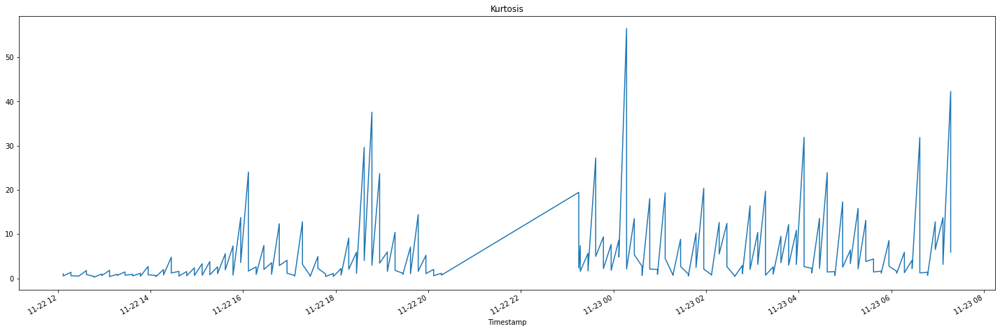

In [210]:
B3['kurtosis'].iloc[-700:-500].plot(figsize=(25,8)).set_title('Kurtosis')

From the above plot and dataframe snapshot, we can intituively say that when kurtosis is >10 the failure starts to appear.

In [201]:
B3[B3['kurtosis'] >10].iloc[0].name

Timestamp('2003-11-22 15:56:56')

In [250]:
B3['fault'] = ''
threshold = pd.to_datetime('2003-11-22 15:56:56')
for i in B3.index:
    if i >= threshold:
        B3.loc[i,'fault'] = 'inner race failure'
    else:
        B3.loc[i,'fault'] = 'normal'

In [251]:
B3['fault'].value_counts()

normal                3658
inner race failure     654
Name: fault, dtype: int64

<AxesSubplot:xlabel='fault', ylabel='count'>

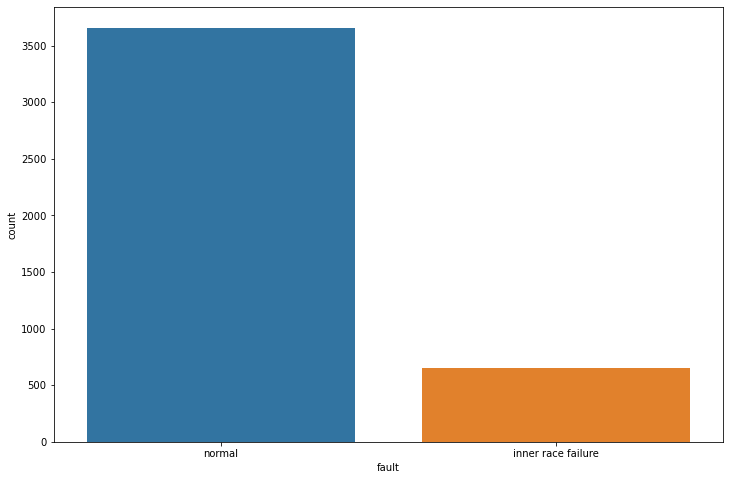

In [252]:
fig = plt.figure(figsize=(12,8))
sns.countplot(x='fault',data=B3)

# Test 1 Bearing 4 - Roller defect identification

In [227]:
import plotly.express as px # working with interactive plots

In [240]:
fig = px.line(data_frame=B4.iloc[-1500:])
fig.show()

In [241]:
for i in B4.columns:
    fig = px.line(B4[i].iloc[-1500:], title=i)
    fig.show()

Either kurtosis or skewness could be used to detect the onset of failure

<AxesSubplot:xlabel='Timestamp'>

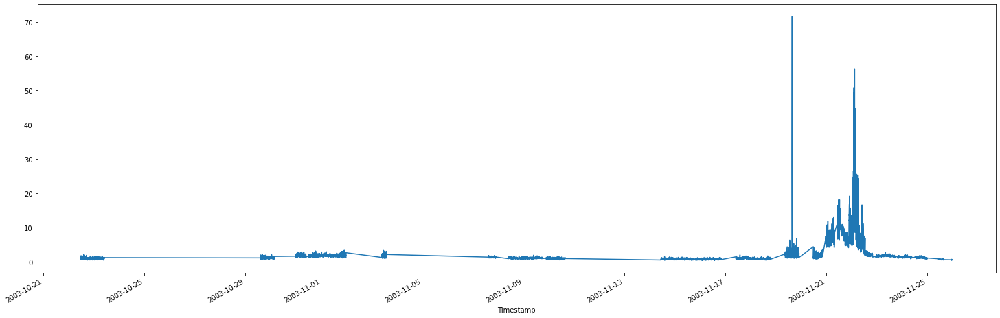

In [243]:
B4['kurtosis'].plot(figsize=(25,8))

In [245]:
B4[B4['kurtosis'] > 65].iloc[0].name

Timestamp('2003-11-19 15:46:07')

In [247]:
B4['fault'] = ''
threshold = pd.to_datetime('2003-11-19 15:46:07')
for i in B4.index:
    if i >= threshold:
        B4.loc[i,'fault'] = 'roller defect'
    else:
        B4.loc[i,'fault'] = 'normal'

In [253]:
B4.tail()

,min,max,range,mean,RMS,standard deviation,skewness,kurtosis,crest factor,form factor,fault
Timestamp,,,,,,,,,,,
2003-11-25 23:19:56,-0.911,0.737,1.648,-0.115266,0.208228,0.173419,-0.076744,0.537177,-6.393908,-1.806498,roller defect
2003-11-25 23:29:56,-0.962,0.686,1.648,-0.114991,0.219317,0.186758,-0.029896,0.581845,-5.965681,-1.907249,roller defect
2003-11-25 23:29:56,-1.157,0.623,1.78,-0.115953,0.202326,0.165808,-0.037215,0.563416,-5.372883,-1.744905,roller defect
2003-11-25 23:39:56,-1.03,0.764,1.794,-0.115535,0.229176,0.197928,-0.018385,0.626495,-6.612725,-1.983611,roller defect
2003-11-25 23:39:56,-0.889,0.796,1.685,-0.114618,0.209928,0.17588,0.051772,0.584901,-6.944786,-1.831537,roller defect


In [256]:
B4['fault'].value_counts()

normal           2934
roller defect    1378
Name: fault, dtype: int64

<AxesSubplot:xlabel='fault', ylabel='count'>

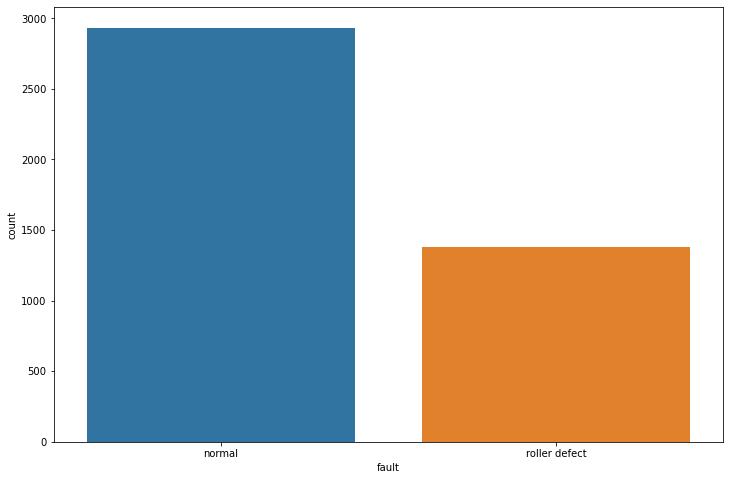

In [254]:
fig = plt.figure(figsize=(12,8))
sns.countplot(x='fault',data=B4)

In [257]:
Test1 = pd.concat([B1,B2,B3,B4])
Test1 = Test1.fillna('normal')

In [259]:
Test1.isnull().sum()

min                   0
max                   0
range                 0
mean                  0
RMS                   0
standard deviation    0
skewness              0
kurtosis              0
crest factor          0
form factor           0
fault                 0
dtype: int64

In [260]:
Test1.to_csv('Test1.csv')

# Test 3 data extraction

In [263]:
B1 = pd.DataFrame(columns = ['min','max','range','mean','RMS','standard deviation','skewness','kurtosis','crest factor','form factor'])
B2 = pd.DataFrame(columns = ['min','max','range','mean','RMS','standard deviation','skewness','kurtosis','crest factor','form factor'])
B3 = pd.DataFrame(columns = ['min','max','range','mean','RMS','standard deviation','skewness','kurtosis','crest factor','form factor'])
B4 = pd.DataFrame(columns = ['min','max','range','mean','RMS','standard deviation','skewness','kurtosis','crest factor','form factor'])

test_no = 'Test3'

for i in os.listdir(test_no):
    filename = i
    path = os.path.join(test_no,i)
    df = pd.read_csv(path, sep='\t', names=['B1','B2','B3','B4'])

    for bn in df.columns:
        temp = np.zeros(10)
        temp[0] = df[bn].min()
        temp[1] = df[bn].max()
        temp[2] = df[bn].max() - df[bn].min()
        temp[3] = df[bn].mean()
        temp[4] = np.sqrt((df[bn]**2).mean())
        temp[5] = df[bn].std()
        temp[6] = df[bn].skew()
        temp[7] = df[bn].kurtosis() 
        temp[8] = df[bn].max()/df[bn].mean()
        temp[9] = (df[bn]**2).mean()**(0.5)/df[bn].mean()

        temp_df = pd.DataFrame(temp).transpose()
        temp_df.columns = ['min','max','range','mean','RMS','standard deviation','skewness','kurtosis','crest factor','form factor']
        temp_df['Timestamp'] = filename

        if bn == 'B1': 
            B1 = B1.append(temp_df)
            B1.index = pd.to_datetime(B1['Timestamp'], format= '%Y.%m.%d.%H.%M.%S')

        if bn == 'B2': 
            B2 = B2.append(temp_df)
            B2.index = pd.to_datetime(B2['Timestamp'], format= '%Y.%m.%d.%H.%M.%S')

        if bn == 'B3': 
            B3 = B3.append(temp_df)
            B3.index = pd.to_datetime(B3['Timestamp'], format= '%Y.%m.%d.%H.%M.%S')

        if bn == 'B4': 
            B4 = B4.append(temp_df)
            B4.index = pd.to_datetime(B4['Timestamp'], format= '%Y.%m.%d.%H.%M.%S')

B1.drop('Timestamp',inplace=True,axis=1)
B2.drop('Timestamp',inplace=True,axis=1)
B3.drop('Timestamp',inplace=True,axis=1)
B4.drop('Timestamp',inplace=True,axis=1)


C:\Users\h260482\AppData\Local\Temp\ipykernel_8972\2916597265.py:31: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\h260482\AppData\Local\Temp\ipykernel_8972\2916597265.py:35: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\h260482\AppData\Local\Temp\ipykernel_8972\2916597265.py:39: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\h260482\AppData\Local\Temp\ipykernel_8972\2916597265.py:43: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\h260482\AppData\Local\Temp\ipykernel_8972\2916597265.py:31: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pand

# Identifying the faults in bearing 3

In [265]:
B3.shape

(6324, 10)

higher number os datapoints are found than mentioned in the description

<AxesSubplot:xlabel='Timestamp'>

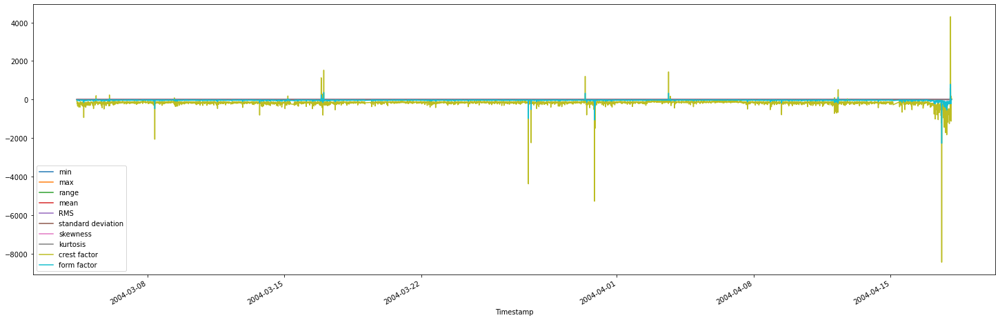

In [275]:
B3.plot(figsize=(25,8))

In [276]:
fig = px.line(data_frame=B3.iloc[:])
fig.show()

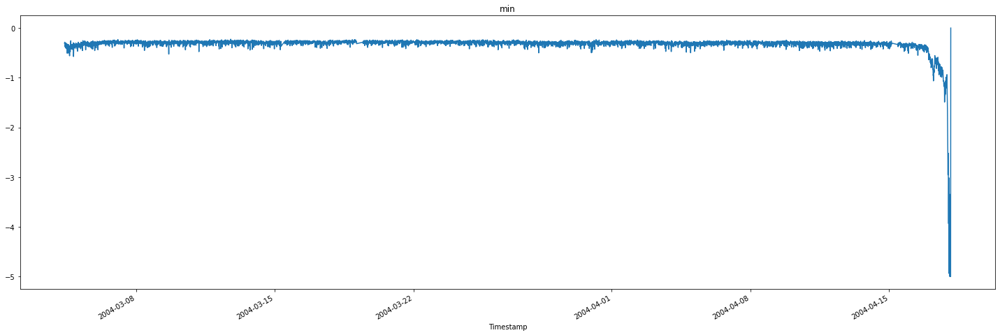

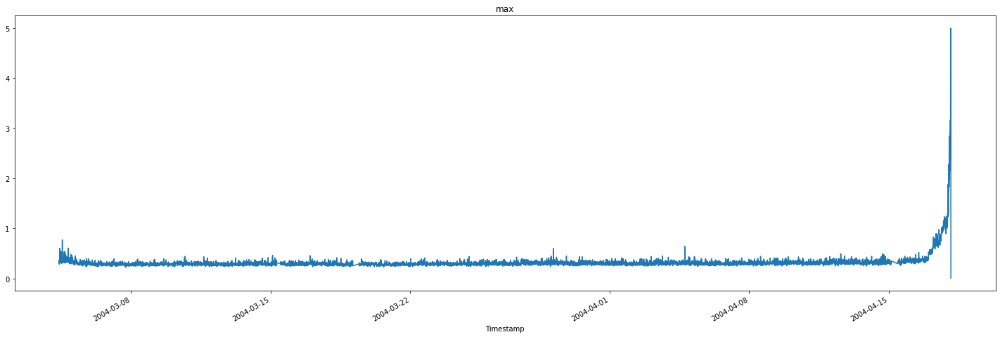

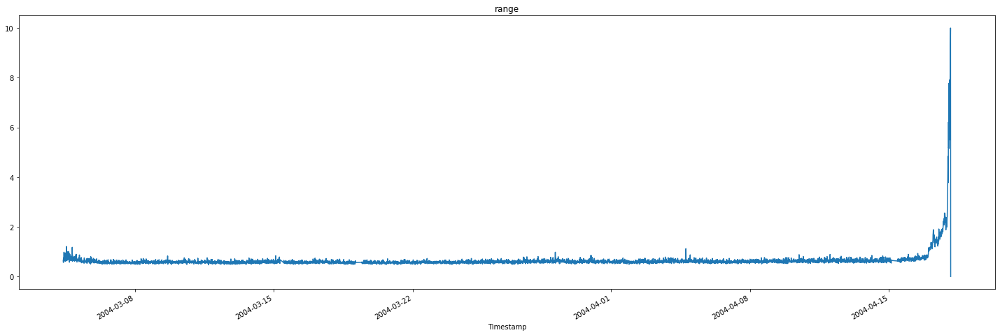

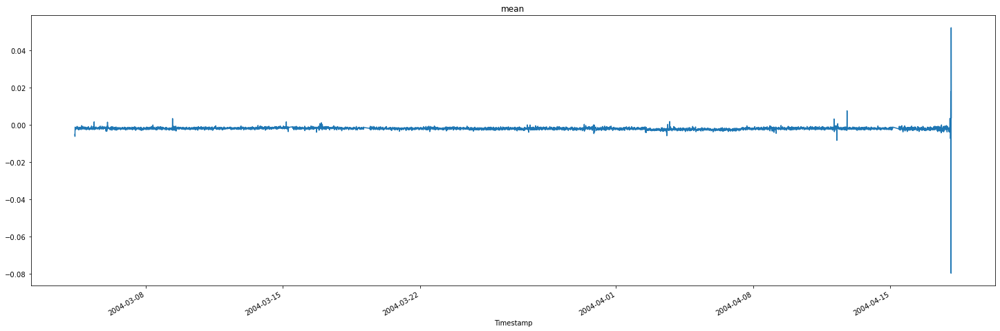

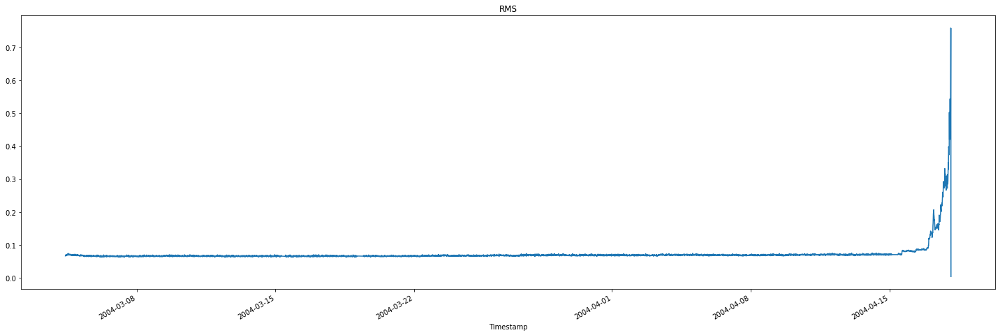

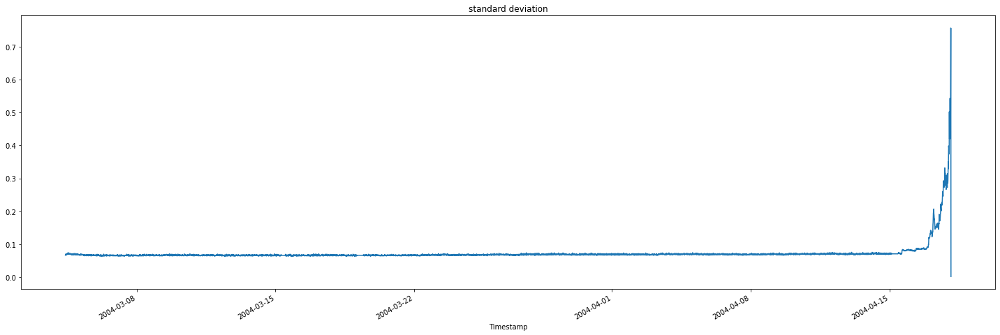

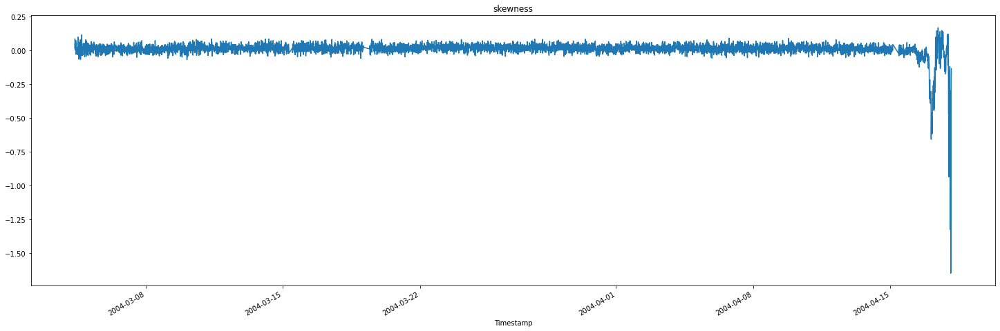

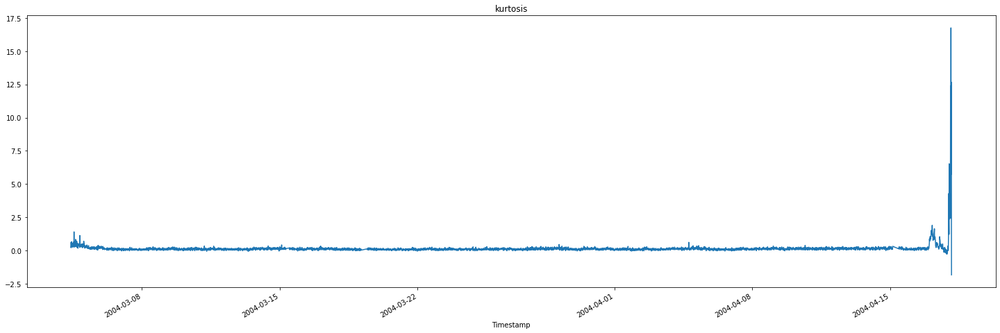

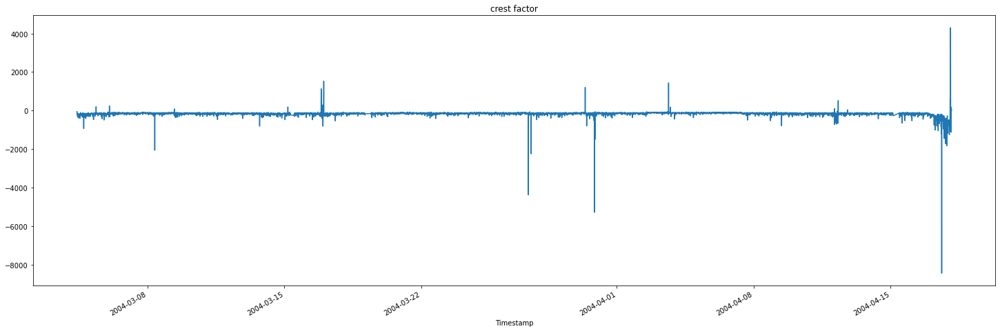

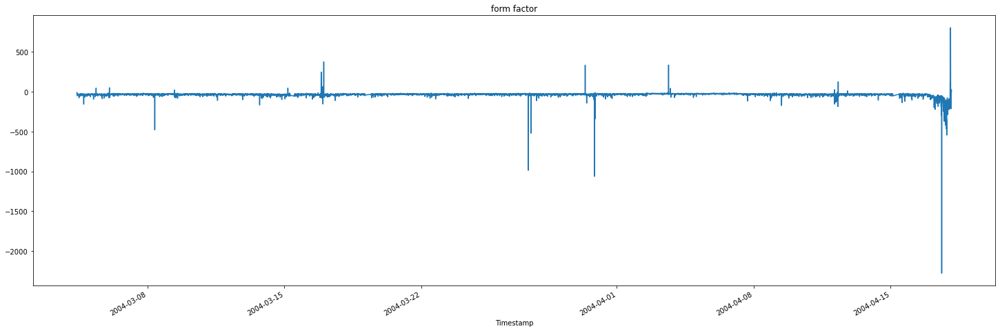

In [278]:
for i in B3.columns:
    plt.figure()
    B3[i].plot(figsize=(25,8)).set_title(i)

RMS value and standard deviation could be used to map the failures

<AxesSubplot:xlabel='Timestamp'>

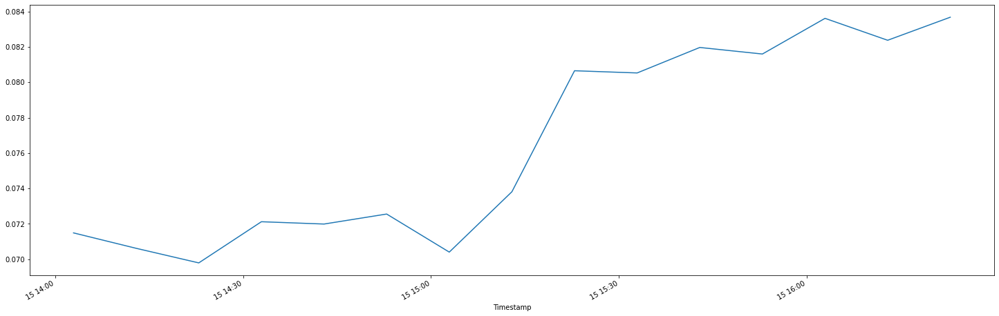

In [319]:
B3['RMS'].iloc[-365:-350].plot(figsize=(25,8))

In [320]:
B3.iloc[-365:][B3['RMS'] > 0.076].iloc[0].name

C:\Users\h260482\AppData\Local\Temp\ipykernel_8972\785914445.py:1: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



Timestamp('2004-04-15 15:22:55')

In [327]:
threshold = '2004-04-15 15:22:55'

In [328]:
B3['fault'] = ''
threshold = pd.to_datetime(threshold)
for i in B3.index:
    if i >= threshold:
        B3.loc[i,'fault'] = 'outer race failure'
    else:
        B3.loc[i,'fault'] = 'normal'

In [330]:
B3.tail()

,min,max,range,mean,RMS,standard deviation,skewness,kurtosis,crest factor,form factor,fault
Timestamp,,,,,,,,,,,
2004-04-18 02:02:55,-5.0,3.167,8.167,0.017613,0.495363,0.495062,-1.648605,16.748551,179.807496,28.12443,outer race failure
2004-04-18 02:12:55,-3.899,2.378,6.277,-0.002114,0.454466,0.454472,-0.656937,5.70981,-1124.822505,-214.967877,outer race failure
2004-04-18 02:22:55,-5.0,4.346,9.346,-0.07984,0.590047,0.584635,-0.426069,12.664939,-54.433708,-7.390347,outer race failure
2004-04-18 02:32:55,-5.0,4.998,9.998,0.052137,0.758765,0.75699,-0.220163,7.06192,95.862442,14.553238,outer race failure
2004-04-18 02:42:55,0.0,0.007,0.007,0.003663,0.003966,0.00152,-0.135512,-1.82658,1.91111,1.082688,outer race failure


In [331]:
B3['fault'].value_counts()

normal                5967
outer race failure     357
Name: fault, dtype: int64

<AxesSubplot:xlabel='fault', ylabel='count'>

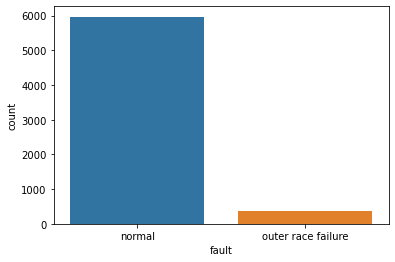

In [332]:
sns.countplot(data=B3,x='fault')

In [336]:
Test3 = pd.concat([B1,B2,B3,B4])

In [341]:
Test3['fault'].value_counts()

normal                24939
outer race failure      357
Name: fault, dtype: int64

In [337]:
Test3.isnull().sum()

min                       0
max                       0
range                     0
mean                      0
RMS                       0
standard deviation        0
skewness                  0
kurtosis                  0
crest factor              0
form factor               0
fault                 18972
dtype: int64

In [338]:
Test3 = Test3.fillna('normal')

In [339]:
Test3.isnull().sum()

min                   0
max                   0
range                 0
mean                  0
RMS                   0
standard deviation    0
skewness              0
kurtosis              0
crest factor          0
form factor           0
fault                 0
dtype: int64

In [340]:
Test3.to_csv('Test3.csv')